# Data Visualization Hands-on: online_shoppers_intention

Master making making predictive recommendations using;
univariate Analysis
bivariate analysis 
clustering  

## Introduction


Activity Focus:  analyze online shoppers' purchasing intentions.

Consumer shopping on the internet is growing year by year. However, the conversion
rates have remained more or less the same. For example, most of us browse through
e-commerce websites such as Amazon, perhaps adding items to a wish list or even an
online shopping cart, only to end up buying nothing.
From this common truth comes the need for tools and solutions that can customize
promotions and advertisements for online shoppers and improve this conversion. 

we will be analyzing various factors that affect a purchaser's decision.

In [19]:
!pip install imblearn

  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.24.1
    Uninstalling scikit-learn-0.24.1:
      Successfully uninstalled scikit-learn-0.24.1


In [6]:
#Libraries
#You can then proceed with the imports in your Jupyter Notebook:
import pandas as pd
import numpy as np
import seaborn assns 
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

In [ ]:
!pip install pandas_profiling

In [74]:
!pip install folium

In [75]:
import folium

In [7]:
import pandas as pd 
import pandas_profiling

In [65]:
#df = pd.read_csv('c://datasets/pima-indians-diabetes.data.csv')
df = pd.read_csv("C:/datasets/onecampus/online_shoppers_intention.csv")

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [67]:
# Checking for Null Values
df.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [68]:
set(df.Revenue)

{False, True}

Exploratory Data Analysis:
    
Using visualization techniques, implement Exploratory Data Analysis (EDA) to investigate the data to find hidden patterns and outliers, often by plotting them in

Use summary statistics to uncover underlying data structures and test any hypotheses.

In [ ]:
We can split exploratory data analytics into three parts:
• Univariate analysis
• Bivariate analysis
• Linear relationships


In [71]:
import tensorflow as tf

In [72]:
import pyspark

## Univariate Analysis

In [ ]:

Univariate analysis is the analysis of each feature (column of a DataFrame)  to uncover the pattern or 
distribution of the data. Lets start by looking at the following features in some more detail:
• Revenue column
• Visitor type
• Traffic type
• Region
• Weekend-wise distribution
• Browser and operating system
• Administrative page
• Information page
• Special day


### Baseline Conversion Rate from the Revenue Column

In [ ]:

This feature simply refers to how many of the online shopping sessions ended in a purchase.
 
Using Seaborn: evisualize the countplot of the Revenue column.  

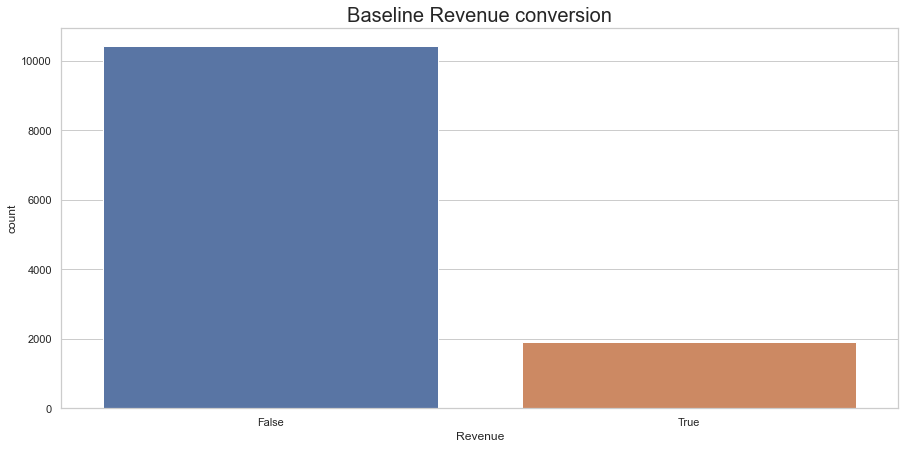

In [76]:
%matplotlib inline
sns.countplot(df['Revenue'])
plt.title('Baseline Revenue conversion', fontsize = 20)
plt.show()

In [ ]:
Hypothesis 1: We are ineffective at getting at converting vists to sales: WEAKNESS

From the preceding graph, we can see that False has a higher number count than True. 

In order to get the exact value, use the .value_counts() function to get the value counts of each subcategory:


In [14]:
print(df['Revenue'].value_counts())# Pandas
print()
print(df['Revenue'].value_counts(normalize=True)) # converts the results in percentages

False    10422
True      1908
Name: Revenue, dtype: int64

False    0.845255
True     0.154745
Name: Revenue, dtype: float64


In [ ]:
What do the results tell us? 

a total of 1,908 customers ended up making a purchase, while 10,422 customers did not.

The baseline conversion rate of online visitors versus overall visitors is a ratio
between the total number of online sessions that led to a purchase divided by the
total number of sessions. 

This is calculated as follows:
1908/12330 * 100 = 15.47%

The overall number of visitors is 12,330, Thus, the conversion rate is 15.47%

### Visitor-Wise Distribution

In [ ]:

Analyze the distribution of visitors to the website. 

Task: Determine which visitor type is most frequent—whether this is new visitors, returning visitors, or
any other category.

First, we draw a countplot using seaborn:


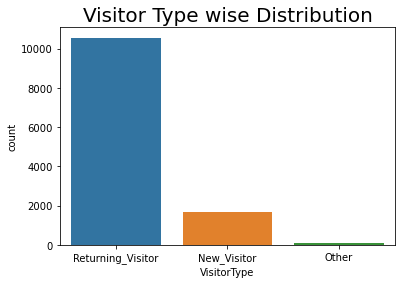

In [15]:
sns.countplot(df['VisitorType'])
plt.title('Visitor Type wise Distribution', fontsize = 20)
plt.show()

In [ ]:
Hypothesis 2: We are good at retaining visitors to our site :  STRENGTH

In [ ]:
# What does this chart tell us?

In [16]:
#Next, we calculate the exact number of visitors belonging to each type:
 
print(df['VisitorType'].value_counts())
print()
print(df['VisitorType'].value_counts(normalize=True))

Returning_Visitor    10551
New_Visitor           1694
Other                   85
Name: VisitorType, dtype: int64

Returning_Visitor    0.855718
New_Visitor          0.137388
Other                0.006894
Name: VisitorType, dtype: float64


In [ ]:
Insight: we can see that the number of returning customers is higher than that of new visitors. 
This is good news as it means we have been successful in attracting customers back to our website

In [ ]:
Next,  conduct further analysis

### Traffic-Wise Distribution

In [ ]:
consider the distribution of traffic. 

Find out how the visitors visit our page to determine what amount of site traffic is accounted 
for by direct visitors (meaning they enter the URL into the browser) and how much is generated 
through other mediums, such as blogs or advertisements.

Plot a countplot for the traffic type to visulize this:

 

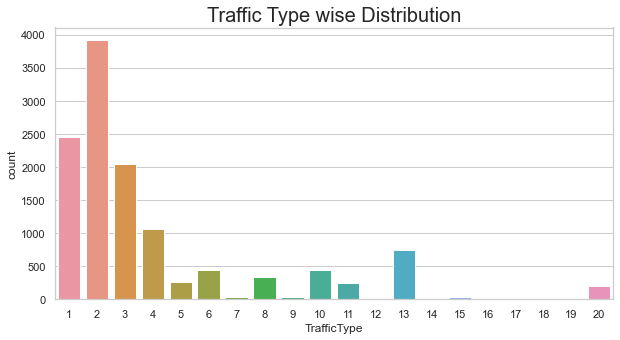

In [70]:
plt.figure(figsize = (10,5))
sns.countplot(df['TrafficType'])
plt.title('Traffic Type wise Distribution', fontsize = 20)
plt.show()

In [ ]:
# Changing size of plots

In [ ]:
Use the seaborn.set() Function to Change the Size of a Seaborn Plot
Use the rcParams Function to Change the Size of a Seaborn Plot
Use the matplotlib.pyplot.figure() Function to Change the Size of a Seaborn Plot
Use the matplotlib.pyplot.gcf() Function to Alter the Size of a Seaborn Plot
Use the height and aspect Parameters to Alter the Size of a Seaborn Plot

# used to control the theme and configurations of the seaborn plot.

#The rc parameter of the function can be used to control the size of the final figure

In [ ]:
# sns.set(rc = {'figure.figsize':(15,8)})

#Similar to the seaborn.set() function, the rcParams in the matplotlin.pyplot module is used to control 
#the style of the plot. We can use the figure.figsize parameter here to change the size of the figure.

#  rcParams['figure.figsize'] = 15,8

#The matplotlib.pyplot.figure() function is used to activate a figure. We can use it before plotting the 
#required seaborn plot. To change the size of the plot, we can use the figsize parameter and 
#give it the desired value for height and width.

# plt.figure(figsize = (15,8))


# The matplotlib.pyplot.gcf() function is used to get an instance of the current figure. 
# We can use the set_size_inches() method with this instance to alter the final size of the plot.

# plt.gcf().set_size_inches(15, 8)

# Different plots in the seaborn module like lmplot, catplot, factorplot, jointplot already have the parameters 
# height and aspect to control the size of the plotted figure.

# sns.countplot(df['TrafficType'],height=8, aspect=15/8)

In [ ]:
Insight:
    
From the preceding graph, we can see that traffic type 2 has the highest count. 
To get the exact value, normalize the count to get the percentage value for each source:


In [18]:
print(df['TrafficType'].value_counts(normalize=True))

2     0.317356
1     0.198783
3     0.166423
4     0.086699
13    0.059854
10    0.036496
6     0.036010
8     0.027818
5     0.021087
11    0.020032
20    0.016058
9     0.003406
7     0.003244
15    0.003082
19    0.001379
14    0.001054
18    0.000811
16    0.000243
12    0.000081
17    0.000081
Name: TrafficType, dtype: float64


In [ ]:
From the preceding information, we can see that sources 2, 1, 3, and 4 account for
the majority of our web traffic.
In the following section, we will check the weekend distribution of the customer

In [ ]:
Exercise 1:

In [ ]:
Analyzing the Distribution of Customers Session on the Website

In this exercise, you will consider the distribution of customers over days of the week
to determine whether customers are more active on weekends or weekdays.

The following steps will help you to complete this exercise:
1. Plot a countplot using seaborn for the weekend column of the DataFrame:


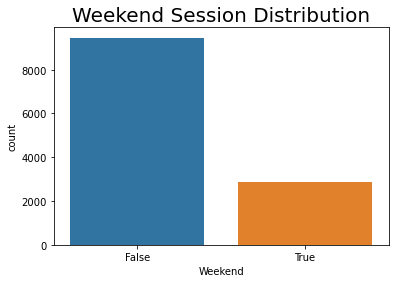

In [19]:
sns.countplot(df['Weekend'])
plt.title('Weekend Session Distribution', fontsize = 20)
plt.show()

In [20]:
#Now, look at the count of each subcategory in the weekend column:
    
print(df['Weekend'].value_counts())
print()
print(df['Weekend'].value_counts(normalize=True))
 
'''The output should tell you which subcategory has the highest count, as shown in
the following screenshot:'''

False    9462
True     2868
Name: Weekend, dtype: int64

False    0.767397
True     0.232603
Name: Weekend, dtype: float64


'The output should tell you which subcategory has the highest count, as shown in\nthe following screenshot:'

In [ ]:
From the count of the False subcategory, we can see that more visitors visit during
weekdays than weekend days.

In [ ]:
### Region-Wise Distribution

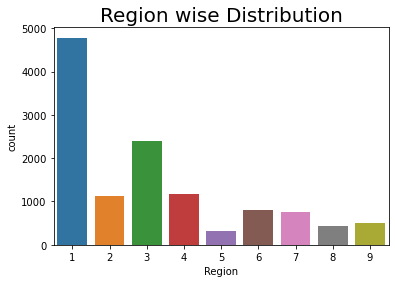

In [24]:

#Next, we look at the region-wise distribution of the sessions. 

'''The objective of this analysis is to find out which region has the highest number of
visitors visiting our website.'''

# Plot the countplot for the Region column:
#plt.figure(figsize = (15,8))
sns.countplot(df['Region'])
plt.title('Region wise Distribution', fontsize = 20)
plt.show()

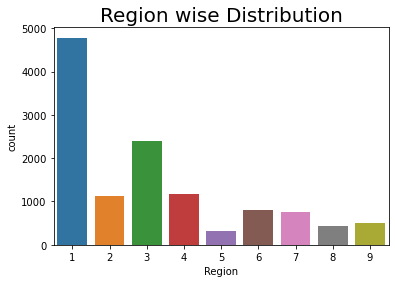

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.countplot(df['Region'])
plt.title('Region wise Distribution', fontsize = 20)
plt.show()

In [ ]:
From the preceding graph, the numbers 1, 2, and so on represent the different
regions that the data is sourced from. 
We can see that Region 1 has the highest number of visitors visiting our website. 

Let's print the value count of each region and normalize the value to find the percentage contribution of each:

In [26]:
print(df['Region'].value_counts())
print()
print(df['Region'].value_counts(normalize=True))

1    4780
3    2403
4    1182
2    1136
6     805
7     761
9     511
8     434
5     318
Name: Region, dtype: int64

1    0.387672
3    0.194891
4    0.095864
2    0.092133
6    0.065288
7    0.061719
9    0.041444
8    0.035199
5    0.025791
Name: Region, dtype: float64


### Exercise 2: Analyzing the Browser and OS Distribution of Customers
In this exercise, we will be checking the distribution of browsers and operating
systems used by customers to determine which type of browser and OS is used by
our visitors. This information will allow us to configure our website so that we can
make it more responsive and user-friendly.


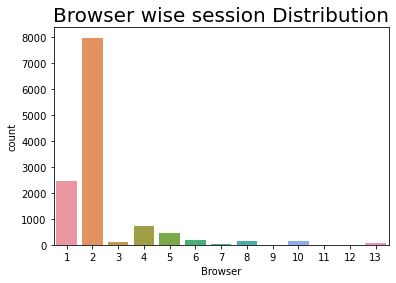

In [27]:
 

'''Perform the following steps to complete this exercise:
1. Draw a countplot using the Browser column of the DataFrame:
2. Use the resulting plot to determine which browser type is the most popular
among visitors:  ''' 
    
sns.countplot(df['Browser'])
plt.title('Browser wise session Distribution', fontsize = 20)
plt.show()



In [ ]:
From the preceding graph, we can see that browser type 2 contributes the most to the website traffic.

In [28]:
## Determine the count of each subcategory with the help of the .value_counts() function: 

print(df['Browser'].value_counts())
print()
print(df['Browser'].value_counts(normalize=True))


2     7961
1     2462
4      736
5      467
6      174
10     163
8      135
3      105
13      61
7       49
12      10
11       6
9        1
Name: Browser, dtype: int64

2     0.645661
1     0.199676
4     0.059692
5     0.037875
6     0.014112
10    0.013220
8     0.010949
3     0.008516
13    0.004947
7     0.003974
12    0.000811
11    0.000487
9     0.000081
Name: Browser, dtype: float64


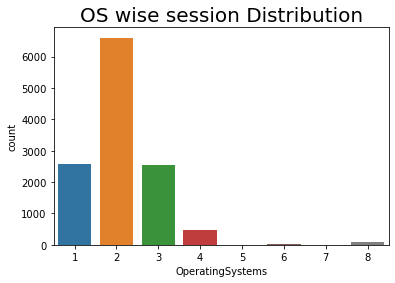

In [29]:
#Draw a countplot with the OperatingSystems column of the DataFrame:
'''import tkinter
import matplotlib
import matplotlib.pyplot as plt'''
#matplotlib.use('TkAgg')
%matplotlib inline

sns.countplot(df['OperatingSystems'])
plt.title('OS wise session Distribution', fontsize = 20)
plt.show()

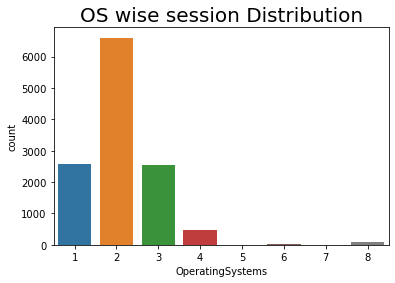

In [30]:
#Draw a countplot with the OperatingSystems column of the DataFrame:

sns.countplot(df['OperatingSystems'])
plt.title('OS wise session Distribution', fontsize = 20)
plt.show()



In [ ]:
5. Once the plot has been drawn, determine which OS type contributes the most to
website traffic:

In [ ]:
From the preceding graph, we can see that OS type 2 contributes the most to the
website traffic.



In [31]:
# 6. Determine the count of each subcategory with the help of the .value_counts() function:
    
print(df['OperatingSystems'].value_counts())
print()
print(df['OperatingSystems'].value_counts(normalize=True))

2    6601
1    2585
3    2555
4     478
8      79
6      19
7       7
5       6
Name: OperatingSystems, dtype: int64

2    0.535361
1    0.209651
3    0.207218
4    0.038767
8    0.006407
6    0.001541
7    0.000568
5    0.000487
Name: OperatingSystems, dtype: float64


In [ ]:
As you know, the visual method of representation is easier to understand as visual
data is certainly more appealing and easier to interpret. 

If we know which OS type is the most predominant, we can ask the tech team to configure the website for that
particular OS and take the necessary actions, such as explicitly defining CSS for that
particular OS and defining valid doctypes.

### Administrative Pageview Distribution

In [ ]:
 
Administrative pages on a website can be pages where the content is being added to
the site or the pages where the site is managed. 

For example, for a WordPress site, ../wp-admin will be the admin page, which, in turn, 
will have multiple pages within itself.

Let's plot the countplot for the Administrative page:


The output will be as follows:

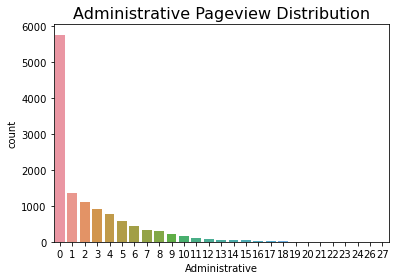

In [32]:
sns.countplot(df['Administrative'])
plt.title('Administrative Pageview Distribution', fontsize = 16)
plt.show()
# We can see from the preceding plot that users tend to visit page 0 the most often.



In [ ]:
### Information Pageview Distribution

In [ ]:
 
The information pages of a site are the pages where the direct information is presented. 
The simple web pages that do not generate leads or that are not connected to lead-generating pages 
can be classified as information pages. 

For example, contact pages that simply display contact information could be considered as information pages.
 
Now, let's plot the count of visitors visiting the information page.

The output will be as follows:

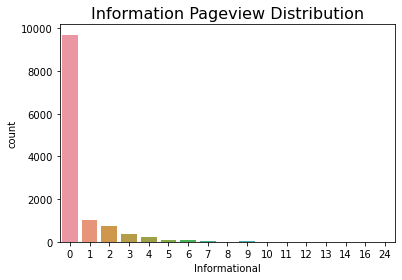

In [33]:

# Plot the countplot for the Informational page:
sns.countplot(df['Informational'])
plt.title('Information Pageview Distribution', fontsize = 16)
plt.show()

In [34]:
'''From the preceding graph, we can see that Information page 0 has the highest
number of visitors. In order to get the exact count of customers visiting each information page, 
we will use the .value_count() function:'''

# To get the percentage count for each information page, we use the normalize=True parameter.
print(df['Informational'].value_counts(normalize=True))


0     0.786618
1     0.084428
2     0.059043
3     0.030819
4     0.018005
5     0.008029
6     0.006326
7     0.002920
9     0.001217
8     0.001135
10    0.000568
12    0.000406
14    0.000162
24    0.000081
16    0.000081
11    0.000081
13    0.000081
Name: Informational, dtype: float64


In [ ]:
79% of users are visiting pages 0 and 1. 

wHAT SHOULD THIS TELL US?

In [ ]:
### Special Day Session Distribution

In this section, we will be looking at the number of visitors during a special day. 
We would like to know whether special days (such as Valentine's Day) impact the number
of users visiting our website.
                                            
Let's plot the countplot for special days:
The output will be as follows:

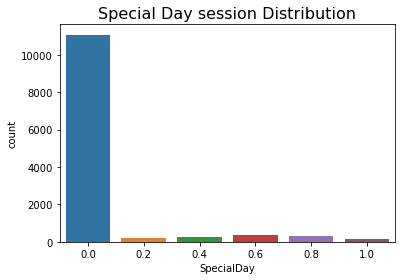

In [35]:
                                           
sns.countplot(df['SpecialDay'])
plt.title('Special Day session Distribution', fontsize = 16)
plt.show()
 

In [36]:
'''From the plot above, we can see that special days have no impact on the number of visitors to our website.

Now, let's look at the percentage distribution for special days:
The output will be as follows:'''
    
print(df['SpecialDay'].value_counts(normalize=True))


0.0    0.898540
0.6    0.028467
0.8    0.026358
0.4    0.019708
0.2    0.014436
1.0    0.012490
Name: SpecialDay, dtype: float64


From the preceding screenshot, we can see that 89.8% of visitors visited during a
non-special day (special day subcategory 0), showing that there is no affinity of web
traffic toward special days.

In [ ]:

Our univariate analysis of distribution plots covered such factors such as region,
month, and type of browser. 

What insights have we uncovered so far?




## Bivariate Analysis


Bivariate analysis is performed between two variables to look at their relationship

In this example, it can be to determine which type of browser leads to a successful transaction, or which region
has the highest number of customers who ended up making a transaction.

We will be performing bivariate analysis between the revenue column and the
following categories:
• Visitor type
• Traffic type
• Region
• Browser type
• Operating system
• Month
• Special day

Now, let's analyze each feature through its relationship to the revenue

### Revenue Versus Visitor Type

In [ ]:

First, consider the relationship between revenue and visitor type.

We will be plotting a categorical plot between Revenue and VisitorType. 

The categorical plot gives you the number of users in each subcategory, and whether each
culminated in a purchase. 

The plot will define those users who did make a purchase as True, and those who did not as False:


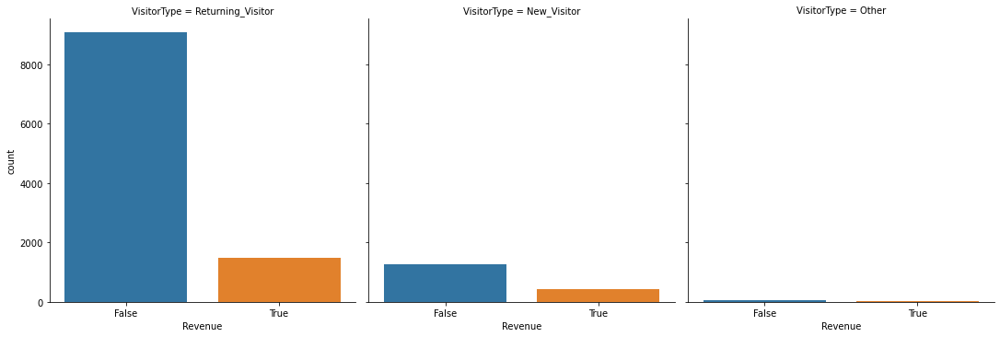

In [38]:
g = sns.catplot("Revenue", col="VisitorType", col_wrap=3, data=df,kind="count", height=5, aspect=1)
plt.show()

As you can see, more revenue conversions happen for returning customers than new customers. 

Can you tease out any insight from this?

### Revenue Versus Traffic Type

Next, consider the relationship between Revenue and TrafficType.
We will be plotting a countplot between revenue and traffic type. The countplot
gives you the number of users in each traffic type, and whether or not they made a
purchase (shown as True or False in the plot):

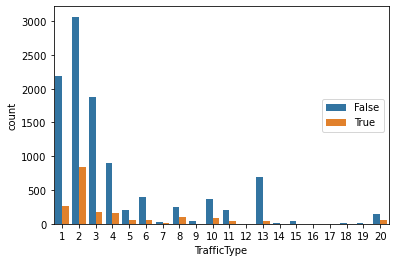

In [39]:
 
sns.countplot(x="TrafficType", hue="Revenue", data=df)
plt.legend(loc='right')
plt.show()

From the preceding plot, we can see that more revenue conversion happens for web traffic generated from source 2. 
Even though source 13 generated a considerable amount of web traffic, conversion is very low compared to others.

#### Exercise 3

In [ ]:
Analyzing the Relationship between Revenue and Other Variables

Goal:  evaluate the relationship between revenue and other variables, such as region, browser, 
operating system, and month of the year, to determine how these variables contribute to sales. 

This information will allow us to plan our marketing campaigns and logistics better.

Perform the following steps to complete this exercise:
1. Plot a countplot for each region by keeping Revenue as the hue parameter.
2. Find the number of customers who end up with a purchase region-wise:


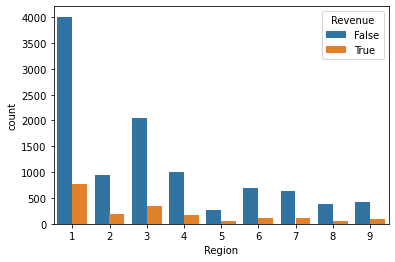

In [41]:
sns.countplot(x="Region", hue="Revenue", data=df)
plt.show()

From the plot, we can see that region 1 accounts for most sales, and
region 3 the second most. 

With this information, we can plan our marketing and supply chain activities in a better way. 

For example, we might propose building a warehouse specifically catering to the needs of region 1 to increase delivery
rates and ensure that products in the highest demand are always well stocked. 

In [ ]:
Consider the relationship between Revenue and the Browser type. 

Create a countplot between revenue and browser type that shows the number
of users per browser type and whether or not they made a purchase (True or False):

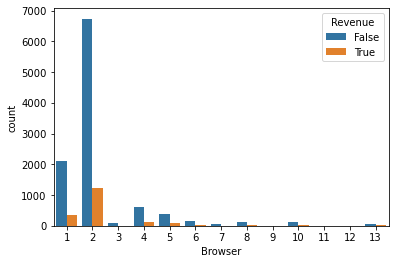

In [42]:

    
sns.countplot(x="Browser", hue="Revenue", data=df)
plt.show()

In [ ]:
As you can see, more revenue-generating transactions have been performed from Browser 2. 
Even though Browser 1 creates a considerable number of sessions, the conversion rate is low. 

This is something we need to investigate further.
Consider the relationship between Revenue and the OperatingSystems type. 

In [ ]:
Create a countplot between Revenue and the OperatingSysytems type that shows the number of users 
per OS type and whether or not they made a purchase (True or False):

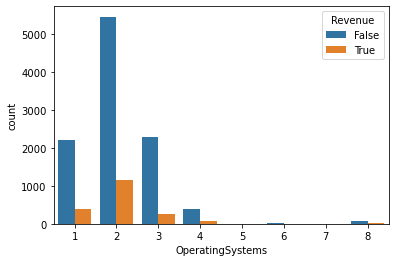

In [43]:
sns.countplot(x="OperatingSystems", hue="Revenue", data=df)
plt.show()

In [ ]:
As you can see, more revenue-generating transactions happened with OS 2 than the other types.
Now consider the relationship between Revenue (did the session end with a purchase?) and Months. 

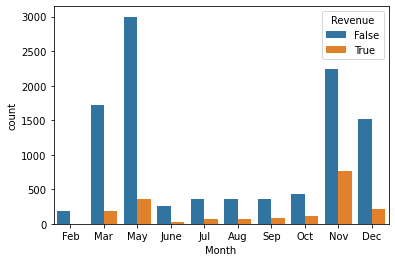

In [44]:
'''Plot a countplot between revenue and month. The countplot gives you the
number of users in any given month ending with a purchase or not (True
or False):'''
sns.countplot(x="Month", hue="Revenue", data=df,order=['Feb','Mar','May','June','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.show()

In [ ]:
Website visitors may be high in May, but we can observe from the bar plot
that a greater number of purchases were made in the month of November. 

## Linear relationship

In [ ]:
In this section, we will be studying the linear relationship between the following variables:
• Bounce rate versus exit rate
• Page value versus bounce rate
• Page value versus exit rate
• Impact of administration page views and administrative pageview duration on revenue
• Impact of information page views and information pageview duration on revenue


Let's start exploring the linear relationships between these variables. 


In [ ]:
### Bounce Rate versus Exit Rate

In [ ]:

The linear relationship between bounce rate versus exit rate can be studied by plotting an LM plot from seaborn.
We are setting the x axis as BounceRates, and the y axis as ExitRates. The data is taken from the df DataFrame:


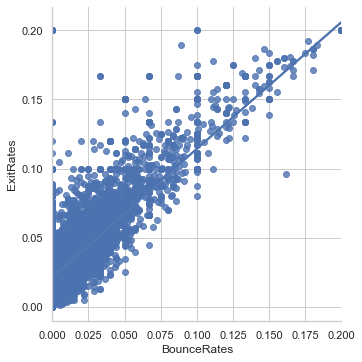

In [45]:
sns.set(style="whitegrid")
ax = sns.lmplot(x="BounceRates", y="ExitRates", data=df)

In [ ]:
What does the chart tell us?

In [ ]:
As you can see, there is a positive correlation between the bounce rate and the exit
rate. With the increase in bounce rate, the exit rate of the page increases.

### Page Value versus Bounce Rate

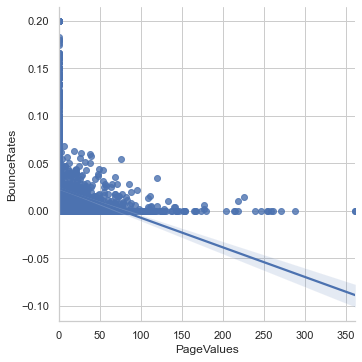

In [46]:

# The linear relationship between the page value and the bounce rate can be studied by plotting an LM plot with seaborn. 

# Set the x axis as PageValue and the y axis as BounceRates. The data is taken from the df DataFrame:
    
sns.set(style="whitegrid")
ax = sns.lmplot(x="PageValues", y="BounceRates" , data=df)

As we can see in the plot, there is a negative correlation between page value and bounce rate. 

As the page value increases, the bounce rate decreases. 

To increase the probability of a customer purchasing with us, we need to improve the
page value—perhaps by making the content more engaging or by using images to convey the information. 

### Page Value versus Exit Rate

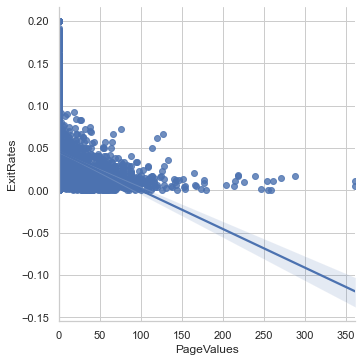

In [47]:

#The linear relationship between PageValues and ExitRates can be studied by plotting an LM plot with seaborn.
#Set the x axis as PageValues and the y axis as ExitRates. The data is taken from the df DataFrame:
    
sns.set(style="whitegrid")
ax = sns.lmplot(x="PageValues", y="ExitRates" , data=df)

As we can see in the preceding plot, there is a negative correlation between page
value and exit rate. Web pages with a better page value have a lower exit rate.

### Impact of Administration Page Views and Administrative Pageview Duration on Revenue

In [ ]:

In this section, we want to look at the relationship between administrative pageviews
and the amount of time spent on it. Does this relationship have an impact on revenue? If so, how?

To study the relationship, draw the LM plot with the x axis as Administrative and the y axis as 
Administrative_Duration, and with the hue parameter as Revenue:

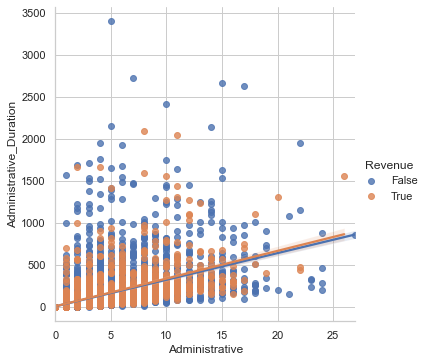

In [48]:
sns.set(style="whitegrid")
ax = sns.lmplot(x="Administrative", y="Administrative_Duration",\
                hue='Revenue', data=df)

From the preceding plot, we can infer that administrative-related pageviews and the
administrative-related pageview duration are positively correlated. When there is an
increase in the number of administrative pageviews, the administrative pageview duration also increases. 

### Impact of Information Page Views and Information Pageview Duration on Revenue


In this section, we want to look at the relationship between the number of views of the information 
pages and the amount of time spent on them. Does this relationship have an impact on revenue? If so, how?

To study the relationship, draw the LM plot with the x axis as Informational and
the y axis as Informational_Duration, and with the hue parameter as Revenue:

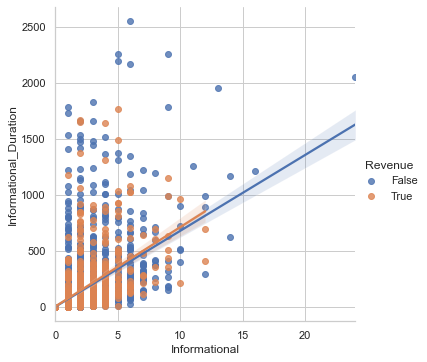

In [49]:

    
sns.set(style="whitegrid")
ax = sns.lmplot(x="Informational", y="Informational_Duration",\
                hue='Revenue', data=df)

In [ ]:
From the preceding plot, we can conclude the following:
    
• Information page views and information pageview duration are positively correlated. 
With an increase in the number of information pageviews, the information pageview duration also increases.
• Customers who have made online purchases visited fewer numbers of informational pages. 
This implies that informational pageviews don't have much effect on revenue generation.

## Clustering

In [ ]:

Clustering is an unsupervised learning technique in which you group categorically similar data points into batches, 
called clusters. Here, we will be focusing on the k-means clustering method.

K-means clustering is a clustering algorithm based on iterations where similar data
points are grouped into a cluster based on their closeness to the cluster centroid. This
means that the model runs iteratively to find the cluster centroid.



In [ ]:
The optimum number of clusters for a dataset is found by using the elbow method.
Method to Find the Optimum Number of Clusters

The logic behind k-means clustering is to define a cluster in such a way that, within
the cluster, the sum of square (WSS) is minimized. 

The smaller the value of WSS, the better the compactness of the cluster. The clusters that are compact have data
points that are similar to one another. 

We will be using the elbow method to find the optimum number of clusters. 

In [ ]:
The elbow method gets its name from the arm-like shape of its line plot. 

The point at which the curve inflects is called the elbow and is an indication that the model fits
best at that particular value of k, where "k" is the number of clusters. 

As shown in the following diagram, the curve bends at the value 2:

In [ ]:
You need to complete the following steps to find the optimum cluster value through the elbow method:
    
1. Compute k-means clustering for different values of k.
2. Vary the value of K from 1-10 in increments of 1.
3. For each k, calculate the total cluster sum of square WSS.
4. Plot the curve for WSS.

The location of a bend in the plot is considered the optimum number of clusters. 

In the preceding graph, K=2 is the optimum value.

The following exercise will guide you through how to use this clustering method on our example dataset.

#### Exercise 4:

In [ ]:
Performing K-means Clustering for Informational Duration versus Bounce Rate

In this exercise, you will perform clustering between the information pageview
duration and bounce rate columns of our dataset. Perform the following steps to
complete this exercise:

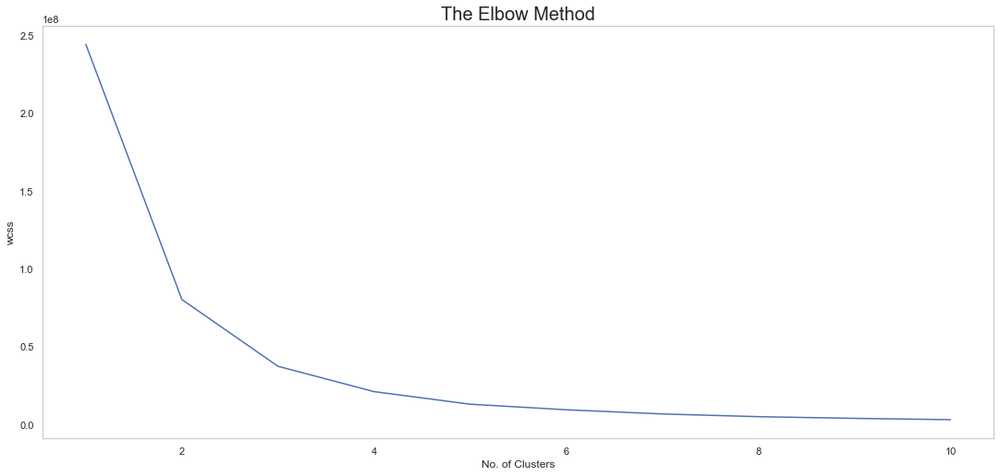

In [58]:
#1. Select the columns and assign them to a variable called x:
    
x = df.iloc[:, [3, 6]].values

#2. Run the k-means algorithm for different values of k. km is the k-means clustering algorithm:
wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', \
                max_iter = 300, n_init = 10, \
                random_state = 0, algorithm = 'elkan', tol = 0.001)
    
    #3. Fit the k-means algorithm to the x variable we defined in the preceding steps:
    km.fit(x)
    labels = km.labels_

    #4. Append the inertia value calculated using Kmeans to wcss:
    wcss.append(km.inertia_)

#5. Plot the value of wcss with the value of k:
plt.rcParams['figure.figsize'] = (15, 7)
plt.plot(range(1, 11), wcss)
plt.grid()
plt.tight_layout()
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

In [ ]:
From the preceding elbow graph, we can infer that k=2 is the optimum value for clustering.

In [59]:
#Now, run k-means clustering with k=2:
km = KMeans(n_clusters = 2, init = 'k-means++', \
            max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

In [ ]:
Plot the scatter plot between Bounce Rates and Informational Duration.

To make the graph more readable, assign the color pink for uninterested customers (in which Revenue is False), 
yellow for target customers (in which Revenue is True), and blue for the centroid of the cluster:

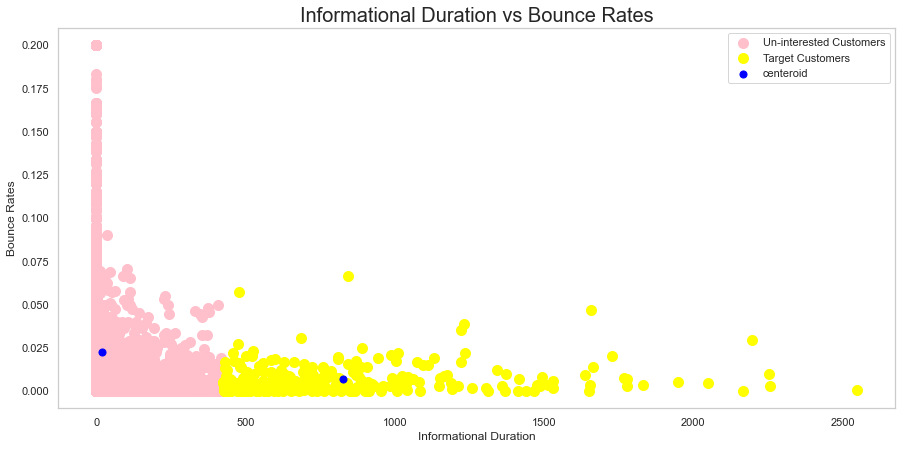

In [60]:
plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, \
            c = 'pink', label = 'Un-interested Customers')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, \
            c = 'yellow', label = 'Target Customers')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], \
            s = 50, c = 'blue' , label = 'centeroid')

plt.title('Informational Duration vs Bounce Rates', fontsize = 20)
plt.grid()
plt.xlabel('Informational Duration')
plt.ylabel('Bounce Rates')
plt.legend()
plt.show()

In [ ]:
From the preceding graph, we can see that our target customers spend around 850-900 seconds 
on average on the Information page.

### Performing K-means Clustering for Informational Duration versus Exit Rate

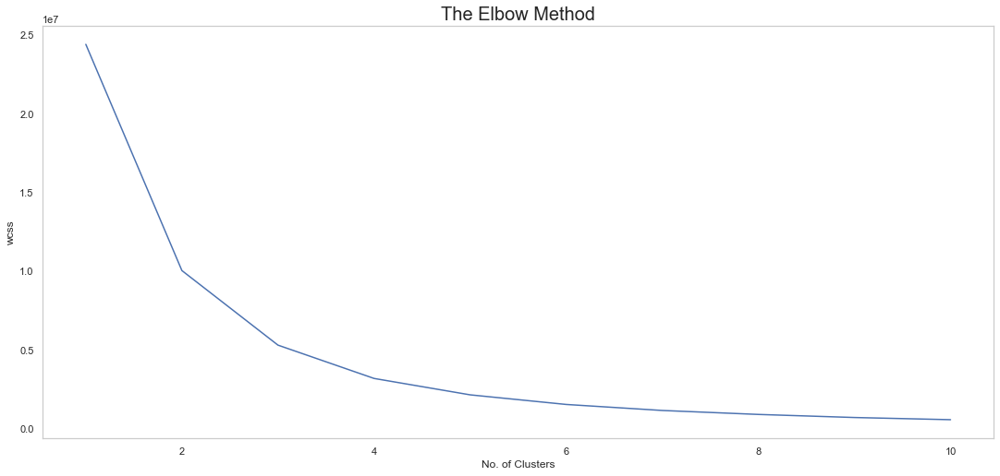

In [62]:

'''We are now going to perform clustering between the information pageview duration
and exit rate columns. Select the columns and assign them to a variable called x:'''

x = df.iloc[:, [4, 7]].values
wcss = []
for i in range(1, 11):
    #Km is the k-means clustering algorithm. Run the k-means algorithm for different values of k (1-10):
    km = KMeans(n_clusters = i, init = 'k-means++', \
                max_iter = 300, n_init = 10, \
                random_state = 0, algorithm = 'elkan', \
                tol = 0.001)
    #Now, fit the k-means algorithm to the x variable we defined previously:
    km.fit(x)
    labels = km.labels_
    #Now, append the inertia value we calculated using Kmeans to wcss:
    wcss.append(km.inertia_)
    
#Now, plot the value of wcss with the value of k:
plt.rcParams['figure.figsize'] = (15, 7)
plt.plot(range(1, 11), wcss)
plt.grid()
plt.tight_layout()
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

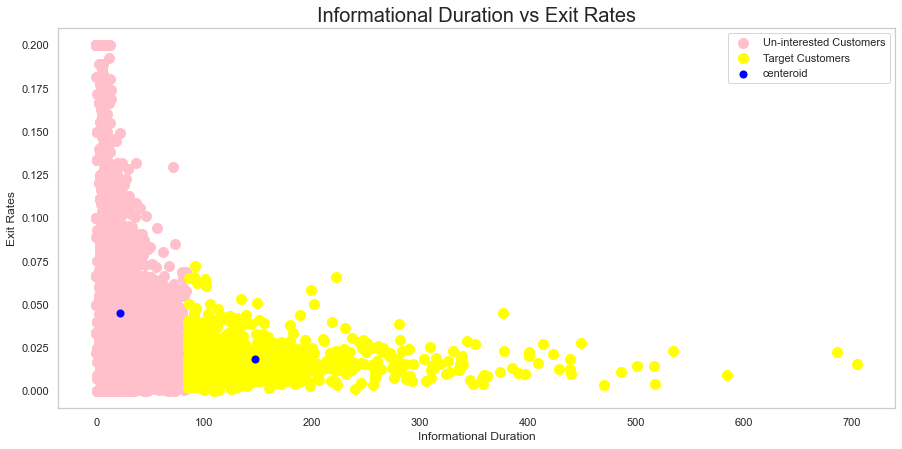

In [64]:
'''From the preceding elbow graph, we can see that k=2 is the optimum value for clustering. 
Now, let's run k-means clustering with k=2:'''

km = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)
plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Un-interested Customers')


'''We plot the scatter plot between the exit rate and information pageview duration.
To make the graph more readable, we'll assign the color pink for uninterested customers (where Revenue is False), 
yellow for target customers (where Revenue is True), and blue for the centroid of the cluster:'''
    
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')
plt.title('Informational Duration vs Exit Rates', fontsize = 20)
plt.grid()
plt.xlabel('Informational Duration')
plt.ylabel('Exit Rates')
plt.legend()
plt.show()

In [ ]:
The scatterplot for Informational Duration versus Exit Rate can be realized as follows:

In [ ]:
From the preceding cluster, we can infer that our target customers spend around 150
seconds more on average than the other customers before exiting.

We are now ready to complete an activity regarding the performance of clustering for
administrative duration versus bounce rate.

## Activity 1

In [ ]:
Performing K-means Clustering for Administrative Duration versus Bounce Rate and Administrative Duration versus Exit Rate

In this activity, you will perform K-means clustering for administrative pageview duration versus bounce rate. 

You need to perform the initial data analysis and check the null values before solving this activity.

Note
The clusters that were formed for informational duration versus bounce rate 
can be taken as a sample to perform this exercise.

In [ ]:
The following steps will help you to complete this activity:
    
1. Select the Administrative Pageview Duration and Bounce Rate columns. Assign the column to a variable called x.
2. Initialize the k-means algorithm.
3. For the different values of K, compute the k-means inertia and store it as a variable called wcss.
4. Plot a graph between wcss and the corresponding k value.
5. Perform k-means clustering between administrative duration versus bounce rate with k=2. 
By performing k-means clustering, we get the centroids of both clusters.

6. Assign the color pink for uninterested customers and the color cyan for our target customer.
7. Use the color blue to denote the centroid of the cluster, which can be obtained from the cluster.
8. Plot a scatter plot between Administrative Duration vs Bounce Rate.
9. Select the Administrative Duration and Exit Rate columns. Assign the column to a variable called x.
10. Initialize the k-means algorithm.
 
11. For the different values of K, compute the Kmeans inertia and store it in a variable called wcss.
12. Plot a graph between wcss and the corresponding k value.

13. Perform k-means clustering between Administrative Duration versus Exit Rate with k=2 to get the 
centroids of both clusters.
282 | Analyzing the Online Shopper's Purchasing Intention
14. Assign the color pink for uninterested customers and the color yellow for our
target customer.
15. Use the color blue to denote the centroid of the cluster, which can be obtained
from the cluster.
16. Plot a scatter plot between Administrative Duration vs
Bounce Rate.

In [ ]:
13. Perform k-means clustering between Administrative Duration versus
Exit Rate with k=2 to get the centroids of both clusters.

14. Assign the color pink for uninterested customers and the color yellow for our target customer.
15. Use the color blue to denote the centroid of the cluster, which can be obtained from the cluster.
16. Plot a scatter plot between Administrative Duration vs Bounce Rate.
 

In [ ]:
From the preceding graph, we can see that the uninterested customer spends less time in administrative 
pages compared with the target customers, who spend around 750 seconds on the administrative page before exiting.

From all the analysis we've performed in this chapter, we can conclude the following:
• The conversion rates of new visitors are high compared to those of returning customers.
• While the number of returning customers to the website is high, the conversion rate is low compared 
to that of new customers.
• Pages with a high page value have a lower bounce rate. We should be talking with our tech team to 
find ways to improve the page value of the web pages.

These factors will largely influence the next plan of action and open new avenues for
more research and new business strategies and plans.

## Summary


we focused on the online shopping dataset, wherein we are trying to draw insights from a customer's 
behavior on the site. 

We analyzed a number of factors, such as conversion rate and total revenue generated.

We also performed univariate and bivariate analysis while taking various dataset features into consideration, 
such as pageview duration, types of visitors, types of traffic, and browsers used. 

Then, we implemented the K-means algorithm and elbow method to find the optimum value of clusters, and visualized 
scatterplots based on this value. 

These plots, in turn, provided us with useful information so that we can plan our next course of action.

Your Project: Ana;llyze credit card defaults of Taiwanese customers and how data analytics can be used to prevent them.

In [14]:
profile = pandas_profiling.ProfileReport(df)

In [15]:
profile 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
# Importing the libraries
import pandas as pd
import numpy as np
  
# data
Student = {
    'Name': ['John', 'Jay', 'sachin', 'Geetha', 'Amutha', 'ganesh'],
    'gender': ['male', 'male', 'male', 'female', 'female', 'male'],
    'math score': [50, 100, 70, 80, 75, 40],
    'test preparation': ['none', 'completed', 'none', 'completed',
                         'completed', 'none'],
}
  
# creating a Dataframe object
df = pd.DataFrame(Student)
  
# Applying the condition
df.loc[df["gender"] == "female", "gender"] = 'RE'

In [5]:
df 

,Name,gender,math score,test preparation
0,John,male,50,none
1,Jay,male,100,completed
2,sachin,male,70,none
3,Geetha,RE,80,completed
4,Amutha,RE,75,completed
5,ganesh,male,40,none
